# EDA

## Imports

In [16]:
# rdflib
import rdflib
from rdflib import Namespace , Literal , URIRef
from rdflib.namespace import RDF , RDFS
from SPARQLWrapper import SPARQLWrapper, JSON

# utils
import ssl, os.path, json, requests , ast
from collections import defaultdict
import itertools

# spacy
import spacy
import random
from spacy.util import minibatch, compounding
from pathlib import Path
from spacy.training import Example

# python3 -m spacy download en_core_web_sm
nlp = spacy.load("en_core_web_sm")

# data proc 
import pandas as pd
import numpy as np
#from apyori import apriori
from efficient_apriori import apriori

from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, fpmax, fpgrowth
from mlxtend.frequent_patterns import association_rules

# graph data
import networkx as nx
from networkx.algorithms import bipartite

# data viz
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

# maps
from ipywidgets import HTML
from ipyleaflet import Map, Marker, Popup, LayersControl, AwesomeIcon

## RQ1. What are the places of education and activity of the selected art historians?


### Map of the places of art historians

In [17]:
center = (41.080684, -30.683374)
m = Map(center=center, zoom=3, close_popup_on_click=False)

if os.path.isfile("RQ1.json"):
    f = open('RQ1.json')
    data_RQ1 = json.load(f)
    

for place in data_RQ1:
    historians = [list(item) for item in set(tuple(row) for row in place["historians"])]
    names = [ hist[1] for hist in historians ]
    namelist = "; ".join(names)
    coords = ast.literal_eval(place["coords"])
    if place["type"] == "geoloc":
        icon2 = AwesomeIcon(
        name = "map-marker",
        marker_color='blue',
        icon_color='white',
        spin=False
        )
        marker = Marker(icon = icon2, location=(coords[1], coords[0]))
        m.add_layer(marker)
    else:
        icon2 = AwesomeIcon(
        name = "bank",
        marker_color='green',
        icon_color='white',
        spin=False
            )
        marker = Marker(icon = icon2, location=(coords[1], coords[0]))
        m.add_layer(marker)
    
    message = HTML()
    marker.popup = message
    message.description = ""
    message.value = "<b>" + place["label"] + "</b>" + "<br/>" + namelist

m

Map(center=[41.080684, -30.683374], close_popup_on_click=False, controls=(ZoomControl(options=['position', 'zo…

### Map of the distribution of art historians

In [18]:
df = pd.read_json("RQ1.json")
df.head()

,QID,label,coords,type,historians
0,http://www.wikidata.org/entity/Q244482,Romagna,"['12.12479', '44.1774']",institution,"[[http://www.wikidata.org/entity/Q55453618, St..."
1,http://www.wikidata.org/entity/Q3757699,Galleria Spada,"['12.471944444', '41.894194444']",institution,"[[http://www.wikidata.org/entity/Q1089074, Fed..."
2,http://www.wikidata.org/entity/Q230899,University of Manchester,"['-2.233611111', '53.465555555']",institution,"[[http://www.wikidata.org/entity/Q3051533, Ell..."
3,http://www.wikidata.org/entity/Q1196,Mecklenburg-Vorpommern,"['12.7', '53.616666666']",geoloc,"[[http://www.wikidata.org/entity/Q3057287, Ern..."
4,http://www.wikidata.org/entity/Q36687,Victoria,"['144.0', '-37.0']",geoloc,"[[http://www.wikidata.org/entity/Q537874, John..."


In [19]:
df[['long','lat']] = df['coords'].str.strip('[]').str.split(', ', expand=True)
#df['list'] = df['historians'].apply(lambda txt: ','.join(map(str, txt ) ) )
df['people'] = [ "; ".join([e[1] for e in i]) for i in df['historians'].tolist() ] 
df['count'] = df.historians.apply(len)
df['long'] = df['long'].str.replace("'",'').astype(float)
df['lat'] = df['lat'].str.replace("'",'').astype(float)
tok = 'pk.eyJ1IjoibWFyaWxlbmFkYXF1aW5vIiwiYSI6ImNpeWx6MjZ3dTAwMjkzMmpyZGR2ejVqZHoifQ.AjYdPJPgptZiqrLSrrHSxQ'
px.set_mapbox_access_token(tok)
fig = px.scatter_mapbox(df, lat="lat", lon="long", size_max=40, color="type",
    size="count", hover_data=["people"], hover_name='label', zoom=2, title='Distribution of historians')
fig.update_layout( mapbox_accesstoken=tok)
#fig.show()

In [20]:
fig = px.bar(df, x="label", y="count",  hover_data=["count"], color="type", hover_name='label', title='Distribution of historians')
fig.update_layout( mapbox_accesstoken=tok)
fig.show()

The most represented places are USA (New York and Los Angeles) and Europe: Rome, Munich and Freiburg, Florence and London.

The most represented institutions include:

 * USA
   * East Coast: NY Universities and museums. Harvard University
   * West Coast: Los Angeles, The Getty Museum
 * Europe
   * Italy: Rome area and Sapienza University. Florence and Villa I Tatti. Bologna. Turin and the University of Turin.
   * Germany: Munich and the Max Planck Society. Berlin and the Humboldt University. Friedburg
   * UK: London, the British Museum and the National Gallery. Oxford and its colleges. Birmingham 

### Relations between art historians 

Based on the network of places and institutions

['Stefano Tumidei', 'Federico Zeri; Federico Zeri', 'Ellis Waterhouse', 'Ernst Steinmann', 'John Pope-Hennessy', 'Wolfgang Lotz', 'Eugenio Battisti', 'Richard Krautheimer', 'Everett Fahy', 'Federico Zeri; Kornél Fabriczy', 'John Pope-Hennessy', 'Ellis Waterhouse', 'Julian Kliemann; Julian Kliemann', 'Federico Zeri; Adolfo Venturi; Luigi Salerno; Lionello Venturi', 'Kornél Fabriczy', 'Richard Krautheimer', 'Eugenio Battisti', 'Ellis Waterhouse', 'Roberto Longhi; Stefano Tumidei; Federico Zeri', 'Luigi Salerno', 'Kornél Fabriczy; Luigi Salerno; Ernst Steinmann; Ulrich Middeldorf; Everett Fahy', 'Luigi Salerno', 'Federico Zeri', 'Aby Warburg', 'Everett Fahy; Federico Zeri; Leo Steinberg; Ernst Kitzinger', 'Leo Steinberg; Federico Zeri; Everett Fahy; John Pope-Hennessy', 'Julian Kliemann', 'Federico Zeri; Leo Steinberg; Julius S. Held', 'Richard Krautheimer', 'Julius S. Held', 'Everett Fahy', 'Ellis Waterhouse', 'Richard Krautheimer', 'Federico Zeri', 'Leo Steinberg; Wolfgang Lotz', 'Ernst

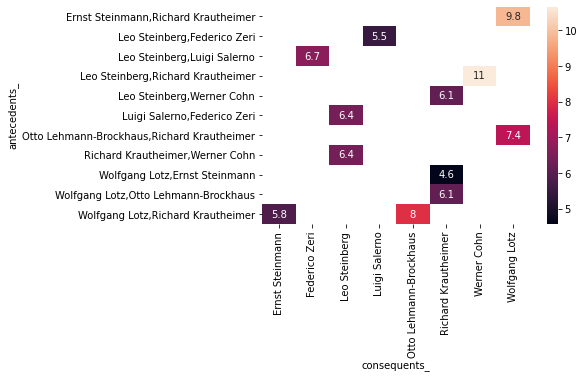

In [21]:
people = df['people'].tolist()
print(people)
people = [ list(set([el]))  if ';' not in el else list(set([i for i in el.split('; ')])) for el in people]
te = TransactionEncoder()
te_ary = te.fit(people).transform(people)
dfrel = pd.DataFrame(te_ary, columns=te.columns_)

frequent_itemsets_historians = fpgrowth(dfrel, min_support=0.02, use_colnames=True)
rules = association_rules(frequent_itemsets_historians, metric="confidence", min_threshold=0.1)
rules['lhs items'] = rules['antecedents'].apply(lambda x:len(x) )
rules[rules['lhs items']>1].sort_values('lift', ascending=False).head()
# Replace frozen sets with strings
rules['antecedents_'] = rules['antecedents'].apply(lambda a: ','.join(list(a)))
rules['consequents_'] = rules['consequents'].apply(lambda a: ','.join(list(a)))
# Transform the DataFrame of rules into a matrix using the lift metric
pivot = rules[rules['lhs items']>1].pivot(index = 'antecedents_', columns = 'consequents_', values= 'lift')
# Generate a heatmap with annotations on and the colorbar off
sns.heatmap(pivot, annot = True)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
plt.show()

Significant cooccurrence of historians:
 
 * W. Cohn, R. Krautimer, L. Steinberg
 * E.Steinemann, R. Krautimer, W. Lotz
 * O.Brockhaus, R. Krautimer, W. Lotz
 * F. Zeri, L. Steinberg, L. Salerno
 * W. Cohn, K. Badt
 
 

Based on only institutions they have in common

In [22]:
dfinst = df.copy()
dfinst = dfinst.drop(dfinst[dfinst["type"] == 'geoloc'].index)

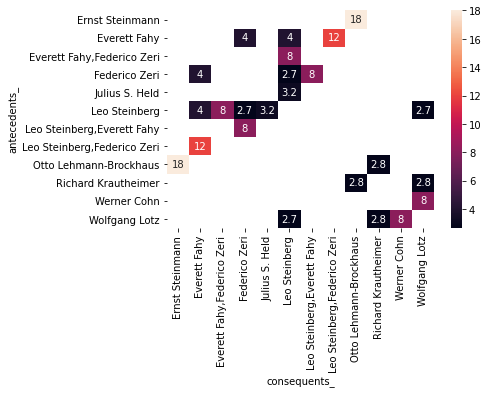

In [23]:
people_inst = dfinst['people'].tolist()
people_inst = [ list(set([el]))  if ';' not in el else list(set([i for i in el.split('; ')])) for el in people_inst]
te = TransactionEncoder()
te_ary = te.fit(people_inst).transform(people_inst)
dfinstt = pd.DataFrame(te_ary, columns=te.columns_)

frequent_itemsets_historians_inst = fpgrowth(dfinstt, min_support=0.02, use_colnames=True)
rules = association_rules(frequent_itemsets_historians_inst, metric="confidence", min_threshold=0.1)
rules['lhs items'] = rules['antecedents'].apply(lambda x:len(x) )
rules[rules['lhs items']>=1].sort_values('lift', ascending=False).head()
# Replace frozen sets with strings
rules['antecedents_'] = rules['antecedents'].apply(lambda a: ','.join(list(a)))
rules['consequents_'] = rules['consequents'].apply(lambda a: ','.join(list(a)))
# Transform the DataFrame of rules into a matrix using the lift metric
pivot = rules[rules['lhs items']>=1].pivot(index = 'antecedents_', columns = 'consequents_', values= 'lift')
# Generate a heatmap with annotations on and the colorbar off
sns.heatmap(pivot, annot = True)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
plt.show()

Significant cooccurrences:
 
 * E. Steinmann , O. L-Brockhaus
 * E. Fahy + L. Steinberg, F. Zeri
 * W. Cohn, W. Lotz
 

### Network of historians 

Based on places and institutions in common

In [71]:
unique_names = set(itertools.chain.from_iterable(people))

# Get all combinations of pairs
all_pairs = list(itertools.combinations(unique_names, 2))

# Create the dictionary
hp_relations = [ (pair[0], pair[1], len([x for x in people if set(pair) <= set(x)]) ) for pair in all_pairs]
hp_relations = [ pair for pair in hp_relations if pair[2] >0]
#print(hp_relations)

G = nx.Graph()
G.add_weighted_edges_from(hp_relations)

plt.figure(1,figsize=(100,100))

pos=nx.circular_layout(G) # pos = nx.nx_agraph.graphviz_layout(G)
nx.draw_networkx_nodes(G,pos,node_color='green',node_size=7500)
 
#3. If you want, add labels to the nodes
labels = {}
for node_name in unique_names:
    labels[str(node_name)] = str(node_name)



nx.draw_networkx_labels(G,pos,labels,font_size=80)

all_weights = []
#4 a. Iterate through the graph nodes to gather all the weights
for (node1,node2,data) in G.edges(data=True):
    all_weights.append(data['weight']) #we'll use this when determining edge thickness

#4 b. Get unique weights
unique_weights = list(set(all_weights))

#4 c. Plot the edges - one by one!
for weight in unique_weights:
    weighted_edges = [(node1,node2) for (node1,node2,edge_attr) in G.edges(data=True) if edge_attr['weight']==weight]
    nx.draw_networkx_edges(G,pos,edgelist=weighted_edges,edge_color='g', width=weight*7.0, alpha= 0.4)

plt.tight_layout()
plt.savefig("locnx.png")
            #orientation ='landscape')

The most connected historians seem to be:

 * R. Krautheimer > W. Lotz (confirmed in the biography of Lotz and collection of R.K), L. Steinberg and W. Cohn (missing E. Steinmann)
 * W. Lotz > R. Krautheimer, Aby Warburg and W. Cohn
 * W. Cohn > R. Krautheimer, L. Steinberg, U. Middeldorf, W. Lotz and E. Steinmann
 * F. Zeri > L. Steinberg, L. Salerno, E. Waterhouse (missing J. Pope-Hennessy and R. Longhi)
 * L. Salerno > F. Zeri and L. Steinberg

### Historians' degree of centrality in the network of academic relations

**<font color='red'>Influential historians</font>** What are the most influential historians? Based on the network of places they are connected to.

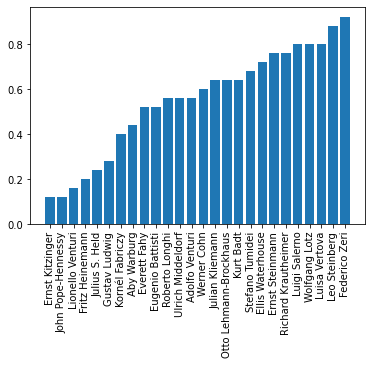

In [72]:
cent = nx.degree_centrality(G)
sorted_centrality = {k: v for k, v in sorted(cent.items(), key=lambda item: item[1])}
plt.bar(range(len(sorted_centrality)), list(sorted_centrality.values()), align='center')
plt.xticks(range(len(sorted_centrality)), list(sorted_centrality.keys()), rotation=90)
plt.show()

Central historians (with a degree higher than 0.8) are:

 * F. Zeri
 * L. Steinberg
 * W. Lotz
 * L. Salerno
 * L. Vertova

Based on the institutions they have in common

In [73]:
df = pd.read_json("RQ1.json")
df['people'] = [ "; ".join([e[1] for e in i]) for i in df['historians'].tolist() ] 
dfinst = df.copy()
dfinst = dfinst.drop(dfinst[dfinst["type"] == 'geoloc'].index)
people_inst = dfinst['people'].tolist()

[('Ernst Kitzinger', 'Leo Steinberg', 1), ('Ernst Kitzinger', 'Federico Zeri', 1), ('Ernst Kitzinger', 'Everett Fahy', 1), ('Ernst Steinmann', 'Julian Kliemann', 1), ('Ernst Steinmann', 'Otto Lehmann-Brockhaus', 2), ('Ernst Steinmann', 'Wolfgang Lotz', 1), ('Ernst Steinmann', 'Richard Krautheimer', 1), ('Julian Kliemann', 'Otto Lehmann-Brockhaus', 1), ('Julian Kliemann', 'Wolfgang Lotz', 1), ('Julian Kliemann', 'Luisa Vertova', 1), ('Julian Kliemann', 'Richard Krautheimer', 1), ('Werner Cohn', 'Leo Steinberg', 1), ('Werner Cohn', 'Wolfgang Lotz', 2), ('Werner Cohn', 'Julius S. Held', 1), ('Werner Cohn', 'Richard Krautheimer', 1), ('Werner Cohn', 'Kurt Badt', 1), ('Roberto Longhi', 'Stefano Tumidei', 1), ('Roberto Longhi', 'Federico Zeri', 1), ('Roberto Longhi', 'Lionello Venturi', 1), ('Ulrich Middeldorf', 'Wolfgang Lotz', 1), ('Ulrich Middeldorf', 'Aby Warburg', 1), ('Otto Lehmann-Brockhaus', 'Wolfgang Lotz', 1), ('Otto Lehmann-Brockhaus', 'Richard Krautheimer', 2), ('Leo Steinberg', 

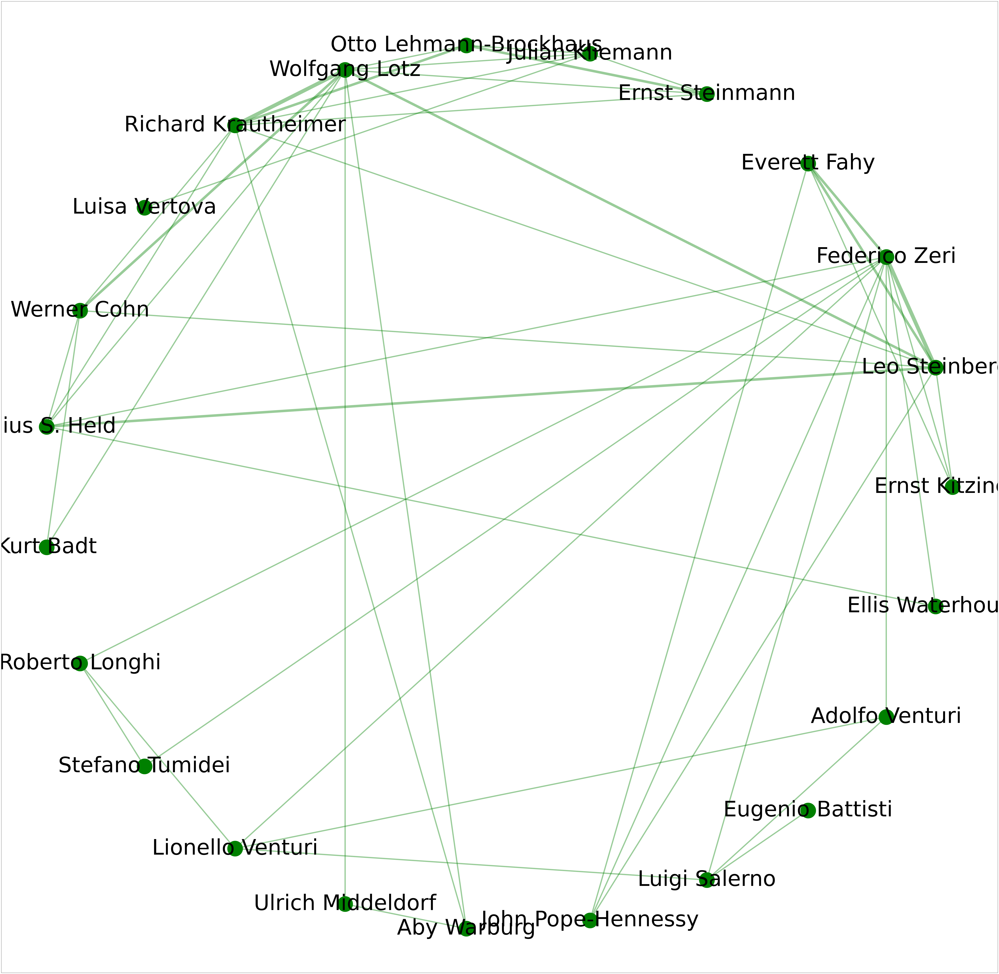

In [74]:
people_ = [ list(set([el]))  if ';' not in el else list(set([i for i in el.split('; ')])) for el in people_inst]
unique_names = set(itertools.chain.from_iterable(people_))

# Get all combinations of pairs
all_pairs = list(itertools.combinations(unique_names, 2))
# Create the dictionary
hp_relations = [ (pair[0], pair[1], len([x for x in people_ if (pair[0] in x and pair[1] in x) ]) ) for pair in all_pairs]
hp_relations = [ pair for pair in hp_relations if pair[2] >0]
print(hp_relations)
Gi = nx.Graph()
Gi.add_weighted_edges_from(hp_relations)

plt.figure(1,figsize=(100,100)) 

pos=nx.circular_layout(Gi) # pos = nx.nx_agraph.graphviz_layout(G)
nx.draw_networkx_nodes(Gi,pos,node_color='green',node_size=7500)
 
#3. If you want, add labels to the nodes

unique_names_available = list(set([n  for pair in hp_relations for n in pair if isinstance(n,str)]))
labels = {}
for node_name in unique_names_available:
    labels[str(node_name)] =str(node_name)

nx.draw_networkx_labels(Gi,pos,labels,font_size=120)

all_weights = []
#4 a. Iterate through the graph nodes to gather all the weights
for (node1,node2,data) in Gi.edges(data=True):
    all_weights.append(data['weight']) #we'll use this when determining edge thickness

#4 b. Get unique weights
unique_weights = list(set(all_weights))

#4 c. Plot the edges - one by one!
for weight in unique_weights:
    weighted_edges = [(node1,node2) for (node1,node2,edge_attr) in Gi.edges(data=True) if edge_attr['weight']==weight]
    nx.draw_networkx_edges(Gi,pos,edgelist=weighted_edges,edge_color='g', width=weight*7.0, alpha= 0.4)

#plt.savefig("locationnetwork.png")

**<font color='red'>Influential historians</font>** What are the most influential historians? Based on the network of institutions they are connected to.

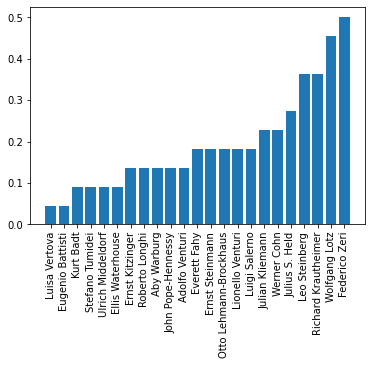

In [75]:
cent = nx.degree_centrality(Gi)
sorted_centrality = {k: v for k, v in sorted(cent.items(), key=lambda item: item[1])}
plt.bar(range(len(sorted_centrality)), list(sorted_centrality.values()), align='center')
plt.xticks(range(len(sorted_centrality)), list(sorted_centrality.keys()), rotation=90)
plt.show()

Central historians (with a much lower degree) keep being: 

 * F. Zeri (still first)
 * W. Lotz
 * R. Krautheimer
 * L. Steinberg

### Relations between places and institutions 

Based on historians' paths.


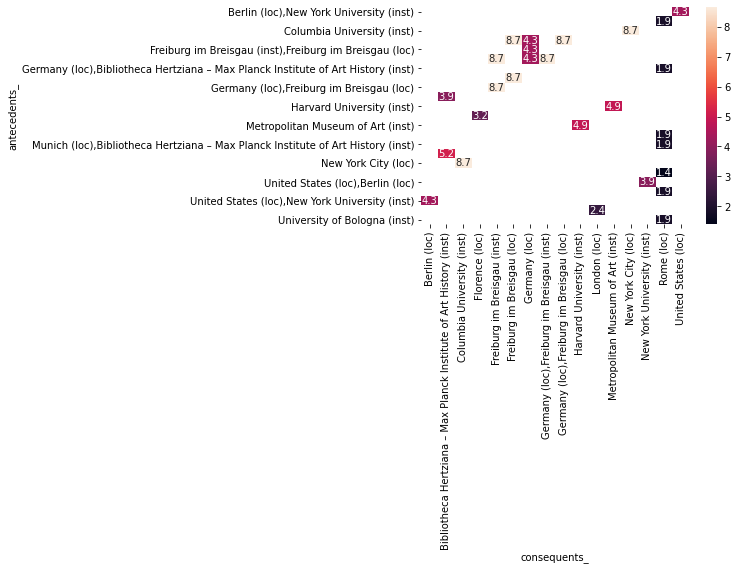

In [76]:
dfh = pd.read_json("RQ1_hist.json")
places = dfh['places'].tolist()

te = TransactionEncoder()
te_ary = te.fit(places).transform(places)
dfp = pd.DataFrame(te_ary, columns=te.columns_)

frequent_itemsets = fpgrowth(dfp, min_support=0.1, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.7)
rules['lhs items'] = rules['antecedents'].apply(lambda x:len(x) )
rules[rules['lhs items']>=1].sort_values('lift', ascending=False).head()
# Replace frozen sets with strings
rules['antecedents_'] = rules['antecedents'].apply(lambda a: ','.join(list(a)))
rules['consequents_'] = rules['consequents'].apply(lambda a: ','.join(list(a)))
# Transform the DataFrame of rules into a matrix using the lift metric
pivot = rules[rules['lhs items']>=1].pivot(index = 'antecedents_', 
                    columns = 'consequents_', values= 'lift')
# Generate a heatmap with annotations on and the colorbar off
sns.heatmap(pivot, annot = True)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
plt.show()

Most relevant rules:
 * Rule 0-3: Hertziana, Rome and Germany / Munich
 * Rule 7-8: New York University and Berlin. 
 * Rule 5-6: London or USA and Rome. 

### Relations between institutions 

Based on historians' paths.


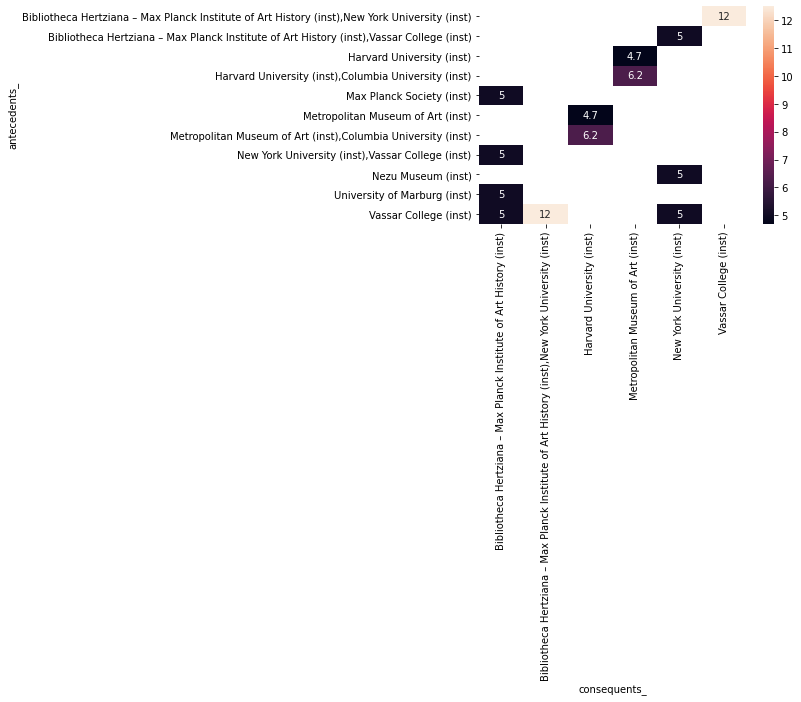

In [77]:
institutions = [[place for place in place_list if "(loc)" not in place] for place_list in places ]
institutions = [x for x in institutions if x]

te = TransactionEncoder()
te_ary = te.fit(places).transform(institutions)
dfi = pd.DataFrame(te_ary, columns=te.columns_)

frequent_itemsets = fpgrowth(dfi, min_support=0.05, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.7)
rules['lhs items'] = rules['antecedents'].apply(lambda x:len(x) )
rules[rules['lhs items']>=1].sort_values('lift', ascending=False).head()
# Replace frozen sets with strings
rules['antecedents_'] = rules['antecedents'].apply(lambda a: ','.join(list(a)))
rules['consequents_'] = rules['consequents'].apply(lambda a: ','.join(list(a)))
# Transform the DataFrame of rules into a matrix using the lift metric
pivot = rules[rules['lhs items']>=1].pivot(index = 'antecedents_', 
                    columns = 'consequents_', values= 'lift')
# Generate a heatmap with annotations on and the colorbar off
sns.heatmap(pivot, annot = True)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
plt.show()

Significant cooccurrence of institutions:

 * Hertziana, NY University, and Vassar College
 * Columbia University, Harvard University, and MET museum

In [23]:
if os.path.isfile("RQ4.json"):
    f = open('RQ4.json')
    data_RQ4 = json.load(f)

In [24]:
periodartist_tuples = []
for k, v in data_RQ4.items():
    for value in v:
        for el in v:
            if value != el:
                tupla = tuple([el, value, 1])
                tuplabis = tuple([value, el, 1])
                if tuplabis not in periodartist_tuples:
                    periodartist_tuples.append(tupla)
                    
print(periodartist_tuples)
 

[('Richard Krautheimer', 'Ernst Kitzinger', 1), ('Otto Lehmann-Brockhaus', 'Ernst Kitzinger', 1), ('Federico Zeri', 'Ernst Kitzinger', 1), ('Kurt Badt', 'Ernst Kitzinger', 1), ('Werner Cohn', 'Ernst Kitzinger', 1), ('Federico Zeri', 'Otto Lehmann-Brockhaus', 1), ('Kurt Badt', 'Otto Lehmann-Brockhaus', 1), ('Werner Cohn', 'Otto Lehmann-Brockhaus', 1), ('Kurt Badt', 'Federico Zeri', 1), ('Werner Cohn', 'Federico Zeri', 1), ('Werner Cohn', 'Kurt Badt', 1), ('Richard Krautheimer', 'Ernst Kitzinger', 1), ('Aby Warburg', 'Everett Fahy', 1), ('Fritz Heinemann', 'Everett Fahy', 1), ('Richard Krautheimer', 'Everett Fahy', 1), ('John Pope-Hennessy', 'Everett Fahy', 1), ('Julian Kliemann', 'Everett Fahy', 1), ('Luisa Vertova', 'Everett Fahy', 1), ('Federico Zeri', 'Everett Fahy', 1), ('Stefano Tumidei', 'Everett Fahy', 1), ('Ernst Steinmann', 'Everett Fahy', 1), ('Leo Steinberg', 'Everett Fahy', 1), ('Werner Cohn', 'Everett Fahy', 1), ('Ulrich Middeldorf', 'Everett Fahy', 1), ('Kornél Fabriczy', 

In [35]:
from collections import Counter
final_periodartist = []
periodartist = Counter(periodartist_tuples)
for k, v in periodartist.items():
    tupla = (k[0], k[1], v)
    final_periodartist.append(tupla)
    
print(final_periodartist)

[('Richard Krautheimer', 'Ernst Kitzinger', 2), ('Otto Lehmann-Brockhaus', 'Ernst Kitzinger', 1), ('Federico Zeri', 'Ernst Kitzinger', 1), ('Kurt Badt', 'Ernst Kitzinger', 1), ('Werner Cohn', 'Ernst Kitzinger', 1), ('Federico Zeri', 'Otto Lehmann-Brockhaus', 1), ('Kurt Badt', 'Otto Lehmann-Brockhaus', 1), ('Werner Cohn', 'Otto Lehmann-Brockhaus', 1), ('Kurt Badt', 'Federico Zeri', 4), ('Werner Cohn', 'Federico Zeri', 2), ('Werner Cohn', 'Kurt Badt', 1), ('Aby Warburg', 'Everett Fahy', 1), ('Fritz Heinemann', 'Everett Fahy', 3), ('Richard Krautheimer', 'Everett Fahy', 1), ('John Pope-Hennessy', 'Everett Fahy', 3), ('Julian Kliemann', 'Everett Fahy', 3), ('Luisa Vertova', 'Everett Fahy', 3), ('Federico Zeri', 'Everett Fahy', 3), ('Stefano Tumidei', 'Everett Fahy', 3), ('Ernst Steinmann', 'Everett Fahy', 2), ('Leo Steinberg', 'Everett Fahy', 1), ('Werner Cohn', 'Everett Fahy', 1), ('Ulrich Middeldorf', 'Everett Fahy', 1), ('Kornél Fabriczy', 'Everett Fahy', 1), ('Wolfgang Lotz', 'Everett 

In [36]:
institutions_and_artists = []
for tupla in final_periodartist:
    for tup in hp_relations:
        if (tupla[0] == tup[0] and tupla[1] == tup[1]) or (tupla[0] == tup[1] and tupla[1] == tup[0]) or (tupla[1] == tup[0] and tupla[0] == tup[1]):
            institutions_and_artists.append((tupla[0], tupla[1], tup[2], tupla[2]))
            
print(institutions_and_artists)
            

[('Federico Zeri', 'Ernst Kitzinger', 1, 1), ('Werner Cohn', 'Kurt Badt', 1, 1), ('John Pope-Hennessy', 'Everett Fahy', 1, 3), ('Federico Zeri', 'Everett Fahy', 2, 3), ('Leo Steinberg', 'Everett Fahy', 2, 1), ('Richard Krautheimer', 'Aby Warburg', 1, 1), ('Ulrich Middeldorf', 'Aby Warburg', 1, 1), ('Wolfgang Lotz', 'Aby Warburg', 1, 1), ('Julian Kliemann', 'Richard Krautheimer', 1, 2), ('Ernst Steinmann', 'Richard Krautheimer', 1, 1), ('Leo Steinberg', 'Richard Krautheimer', 1, 2), ('Werner Cohn', 'Richard Krautheimer', 1, 2), ('Wolfgang Lotz', 'Richard Krautheimer', 3, 3), ('Federico Zeri', 'John Pope-Hennessy', 1, 3), ('Leo Steinberg', 'John Pope-Hennessy', 1, 1), ('Luisa Vertova', 'Julian Kliemann', 1, 4), ('Ernst Steinmann', 'Julian Kliemann', 1, 1), ('Wolfgang Lotz', 'Julian Kliemann', 1, 4), ('Stefano Tumidei', 'Federico Zeri', 1, 6), ('Leo Steinberg', 'Federico Zeri', 3, 1), ('Wolfgang Lotz', 'Ernst Steinmann', 1, 1), ('Werner Cohn', 'Leo Steinberg', 1, 1), ('Wolfgang Lotz', 'Le

In [50]:
ha_table = []
for artist_period, historians in data_RQ4.items():
    #print(artist_period, historians)
    for el in final_periodartist:
        if el[0] in historians and el[1] in historians:
            print(el, artist_period, historians)
            ha_table.append(tuple([el[0], el[1], artist_period]))
#print(ha_table)

('Richard Krautheimer', 'Ernst Kitzinger', 2) byzantine art ['Ernst Kitzinger', 'Richard Krautheimer']
('Otto Lehmann-Brockhaus', 'Ernst Kitzinger', 1) middle ages ['Ernst Kitzinger', 'Otto Lehmann-Brockhaus', 'Federico Zeri', 'Kurt Badt', 'Werner Cohn']
('Federico Zeri', 'Ernst Kitzinger', 1) middle ages ['Ernst Kitzinger', 'Otto Lehmann-Brockhaus', 'Federico Zeri', 'Kurt Badt', 'Werner Cohn']
('Kurt Badt', 'Ernst Kitzinger', 1) middle ages ['Ernst Kitzinger', 'Otto Lehmann-Brockhaus', 'Federico Zeri', 'Kurt Badt', 'Werner Cohn']
('Werner Cohn', 'Ernst Kitzinger', 1) middle ages ['Ernst Kitzinger', 'Otto Lehmann-Brockhaus', 'Federico Zeri', 'Kurt Badt', 'Werner Cohn']
('Federico Zeri', 'Otto Lehmann-Brockhaus', 1) middle ages ['Ernst Kitzinger', 'Otto Lehmann-Brockhaus', 'Federico Zeri', 'Kurt Badt', 'Werner Cohn']
('Kurt Badt', 'Otto Lehmann-Brockhaus', 1) middle ages ['Ernst Kitzinger', 'Otto Lehmann-Brockhaus', 'Federico Zeri', 'Kurt Badt', 'Werner Cohn']
('Werner Cohn', 'Otto Lehm

In [51]:
import csv
with open('artists_periods.csv', mode='w') as my_file:
    my_writer = csv.writer(my_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_ALL)
    # write the column names
    my_writer.writerow(['art_hist1', 'art_hist_2','artist_or_period'])
    
    # access the list of tuples of the query results
    for res in ha_table:
        #print(res)
        # write in the csv
        my_writer.writerow([res[0], res[1], res[2]])

('Richard Krautheimer', 'Ernst Kitzinger', 'byzantine art')
('Otto Lehmann-Brockhaus', 'Ernst Kitzinger', 'middle ages')
('Federico Zeri', 'Ernst Kitzinger', 'middle ages')
('Kurt Badt', 'Ernst Kitzinger', 'middle ages')
('Werner Cohn', 'Ernst Kitzinger', 'middle ages')
('Federico Zeri', 'Otto Lehmann-Brockhaus', 'middle ages')
('Kurt Badt', 'Otto Lehmann-Brockhaus', 'middle ages')
('Werner Cohn', 'Otto Lehmann-Brockhaus', 'middle ages')
('Kurt Badt', 'Federico Zeri', 'middle ages')
('Werner Cohn', 'Federico Zeri', 'middle ages')
('Werner Cohn', 'Kurt Badt', 'middle ages')
('Richard Krautheimer', 'Ernst Kitzinger', 'early christian art and architecture')
('Werner Cohn', 'Federico Zeri', 'renaissance')
('Aby Warburg', 'Everett Fahy', 'renaissance')
('Fritz Heinemann', 'Everett Fahy', 'renaissance')
('Richard Krautheimer', 'Everett Fahy', 'renaissance')
('John Pope-Hennessy', 'Everett Fahy', 'renaissance')
('Julian Kliemann', 'Everett Fahy', 'renaissance')
('Luisa Vertova', 'Everett Fahy

In [52]:
df = pd.read_csv("artists_periods.csv")
df.head()

,art_hist1,art_hist_2,artist_or_period
0,Richard Krautheimer,Ernst Kitzinger,byzantine art
1,Otto Lehmann-Brockhaus,Ernst Kitzinger,middle ages
2,Federico Zeri,Ernst Kitzinger,middle ages
3,Kurt Badt,Ernst Kitzinger,middle ages
4,Werner Cohn,Ernst Kitzinger,middle ages


In [70]:
hi_table = []
for place in data_RQ1:
    historians = [list(item) for item in set(tuple(row) for row in place["historians"])]
    names = [ hist[1] for hist in historians ]
    if place["type"] != "geoloc":
        #print(place["label"], names)
        for el in hp_relations:
            if el[0] in names and el[1] in names:
                hi_table.append(tuple([el[0], el[1], place["label"]]))

In [71]:
with open('institutions.csv', mode='w') as my_file:
    my_writer = csv.writer(my_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_ALL)
    # write the column names
    my_writer.writerow(['art_hist1', 'art_hist_2','institution'])
    
    # access the list of tuples of the query results
    for res in hi_table:
        # write in the csv
        my_writer.writerow([res[0], res[1], res[2]])

In [69]:
df = pd.read_csv("institutions.csv")
df.head()

,art_hist1,art_hist_2,institution
0,Lionello Venturi,Luigi Salerno,Sapienza University of Rome
1,Lionello Venturi,Adolfo Venturi,Sapienza University of Rome
2,Lionello Venturi,Federico Zeri,Sapienza University of Rome
3,Luigi Salerno,Adolfo Venturi,Sapienza University of Rome
4,Luigi Salerno,Federico Zeri,Sapienza University of Rome


In [77]:
hia_table = []
for tupla in hi_table:
    for tup in ha_table:
        if (tupla[0] == tup[0] and tupla[1] == tup[1]) or (tupla[0] == tup[1] and tupla[1] == tup[0]) or (tupla[1] == tup[0] and tupla[0] == tup[1]):
            hia_table.append(tuple([tupla[0], tupla[1], tup[2], tupla[2]]))
print(hia_table)

[('Luigi Salerno', 'Federico Zeri', 'baroque', 'Sapienza University of Rome'), ('Luigi Salerno', 'Federico Zeri', '17th century', 'Sapienza University of Rome'), ('Luigi Salerno', 'Federico Zeri', 'Caravaggio', 'Sapienza University of Rome'), ('Stefano Tumidei', 'Federico Zeri', 'renaissance', 'University of Bologna'), ('Stefano Tumidei', 'Federico Zeri', '15th century', 'University of Bologna'), ('Stefano Tumidei', 'Federico Zeri', '16th century', 'University of Bologna'), ('Stefano Tumidei', 'Federico Zeri', 'baroque', 'University of Bologna'), ('Stefano Tumidei', 'Federico Zeri', '17th century', 'University of Bologna'), ('Stefano Tumidei', 'Federico Zeri', 'Gian Lorenzo Bernini', 'University of Bologna'), ('Leo Steinberg', 'Everett Fahy', 'renaissance', 'Harvard University'), ('Leo Steinberg', 'Federico Zeri', 'renaissance', 'Harvard University'), ('Ernst Kitzinger', 'Federico Zeri', 'middle ages', 'Harvard University'), ('Everett Fahy', 'Federico Zeri', 'renaissance', 'Harvard Uni

In [79]:
with open('institutions_artists.csv', mode='w') as my_file:
    my_writer = csv.writer(my_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_ALL)
    # write the column names
    my_writer.writerow(['art_hist1', 'art_hist_2', 'period_artist','institution'])
    
    # access the list of tuples of the query results
    for res in hia_table:
        # write in the csv
        my_writer.writerow([res[0], res[1], res[2], res[3]])

In [80]:
df = pd.read_csv("institutions_artists.csv")
df.head()

,art_hist1,art_hist_2,period_artist,institution
0,Luigi Salerno,Federico Zeri,baroque,Sapienza University of Rome
1,Luigi Salerno,Federico Zeri,17th century,Sapienza University of Rome
2,Luigi Salerno,Federico Zeri,Caravaggio,Sapienza University of Rome
3,Stefano Tumidei,Federico Zeri,renaissance,University of Bologna
4,Stefano Tumidei,Federico Zeri,15th century,University of Bologna
